In [2]:
# Importing all the necessary libraries for the project
import numpy as np
import pandas as pd
import tensorflow as tf
import keras
import matplotlib.pyplot as plt
from PIL import Image
import os
import zipfile
 
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load the TensorBoard notebook extension
%load_ext tensorboard
 
# Set seed to 42 to have similar results
import random as python_random
 
np.random.seed(42)
python_random.seed(42)
tf.random.set_seed(42)

import seaborn as sn
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
# Use scikit-learn to get statistics
import sklearn.metrics as metrics

from tensorboard.plugins.hparams import api as hp

# Clear any logs from previous runs
#!rm -rf ./logs/

In [3]:
# Show tensorflow version
print(tf.__version__)
 
# check GPU version of tensorflow
if tf.test.gpu_device_name():
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
else:
    print("Please install GPU version of TF")

2.5.0
Please install GPU version of TF


# Data Processing

In [4]:
!wget --no-check-certificate \
    https://github.com/abdo-projects/data-science-portfolio/raw/main/Dataset/Markisa_v2.zip \
    -O /tmp/Markisa_v2.zip

--2021-08-02 15:46:07--  https://github.com/abdo-projects/data-science-portfolio/raw/main/Dataset/Markisa_v2.zip
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/abdo-projects/data-science-portfolio/main/Dataset/Markisa_v2.zip [following]
--2021-08-02 15:46:07--  https://raw.githubusercontent.com/abdo-projects/data-science-portfolio/main/Dataset/Markisa_v2.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 16392079 (16M) [application/zip]
Saving to: ‘/tmp/Markisa_v2.zip’

/tmp/Markisa_v2.zip 100%[===================>]  15.63M  43.5MB/s    in 0.4s    

2021-08-02 15:46:08 (43.5 MB/s) - ‘/tmp/Mark

In [5]:
local_zip = '/tmp/Markisa_v2.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp/Markisa_v2')

zip_ref.close()

In [6]:
# Directory with our training Markisa Besar pictures
train_besar_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/training_data/Markisa Besar')

# Directory with our training Kuning pictures
train_kuning_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/training_data/Markisa Kuning')

# Directory with our training Manis pictures
train_manis_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/training_data/Markisa Manis')

# Directory with our training Ungu pictures
train_ungu_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/training_data/Markisa Ungu')




# Directory with our validation Besar pictures
validation_besar_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/validation_data/Markisa Besar')

# Directory with our validation Kuning pictures
validation_kuning_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/validation_data/Markisa Kuning')

# Directory with our validation Manis pictures
validation_manis_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/validation_data/Markisa Manis')

# Directory with our validation Ungu pictures
validation_ungu_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/validation_data/Markisa Ungu')

In [7]:
train_besar_names = os.listdir(train_besar_dir)
print(train_besar_names[:10])

train_kuning_names = os.listdir(train_kuning_dir)
print(train_kuning_names[:10])

train_manis_names = os.listdir(train_manis_dir)
print(train_manis_names[:10])

train_ungu_names = os.listdir(train_ungu_dir)
print(train_ungu_names[:10])



validation_besar_hames = os.listdir(validation_besar_dir)
print(validation_besar_hames[:10])

validation_kuning_names = os.listdir(validation_kuning_dir)
print(validation_kuning_names[:10])

validation_manis_hames = os.listdir(validation_manis_dir)
print(validation_manis_hames[:10])

validation_ungu_names = os.listdir(validation_ungu_dir)
print(validation_ungu_names[:10])

['aug_img_0_4308.jpeg', 'aug_img_0_9232.jpeg', 'aug_img_0_7009.jpeg', 'aug_img_0_8680.jpeg', 'gg.jpg', 'aug_img_0_9653.jpeg', 'aug_img_0_8112.jpeg', 'aug_img_0_632.jpeg', 'Capture20.JPG', 'aug_img_0_7259.jpeg']
['119.jpg', '63.jpg', '50.jpg', '147.jpg', '142.jpg', '161.jpg', '123.jpg', '146.jpg', '64.jpg', '158.jpg']
['IMG_20210506_194946.jpg', 'IMG_20210506_194903.jpg', 'IMG_20210506_194902.jpg', 'IMG_20210506_194916.jpg', 'IMG_20210506_195006.jpg', 'IMG_20210506_195039.jpg', 'IMG_20210506_195138.jpg', 'IMG_20210506_194956.jpg', 'IMG_20210506_193501.jpg', 'IMG_20210506_193734.jpg']
['IMG20210509172413.jpg', 'IMG20210509192320.jpg', 'IMG20210509163956.jpg', 'IMG20210509174230.jpg', 'IMG20210509191127.jpg', 'IMG20210509193456.jpg', 'IMG20210509191218.jpg', 'IMG20210509191155.jpg', 'IMG20210509191050.jpg', 'IMG20210509165501.jpg']
['PAS-GQU-72.jpg', 'images (14).jpg', 'markisa-fruit-passiflora-jumbo-sweet-201319554.jpg', 'passiflora_quadrangularis_seeds__1555488303_a1c14c1e_progressive.j

In [8]:
print('total training besar images:', len(os.listdir(train_besar_dir)))
print('total training kuning images:', len(os.listdir(train_kuning_dir)))
print('total training manis images:', len(os.listdir(train_manis_dir)))
print('total training ungu images:', len(os.listdir(train_ungu_dir)))


print('total validation besar images:', len(os.listdir(validation_besar_dir)))
print('total validation kuning images:', len(os.listdir(validation_kuning_dir)))
print('total validation manis images:', len(os.listdir(validation_manis_dir)))
print('total validation ungu images:', len(os.listdir(validation_ungu_dir)))

total training besar images: 200
total training kuning images: 200
total training manis images: 200
total training ungu images: 200
total validation besar images: 25
total validation kuning images: 25
total validation manis images: 25
total validation ungu images: 25


In [9]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 8

# Index for iterating over images
pic_index = 0

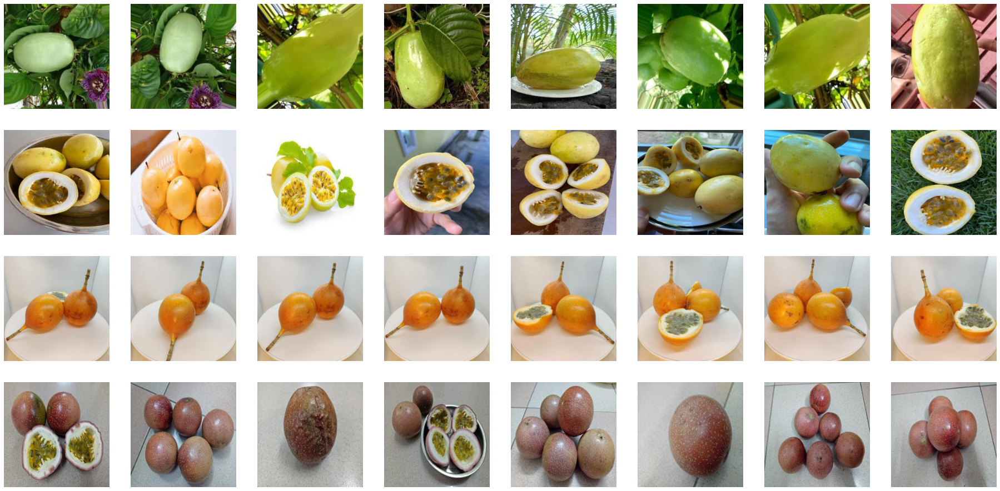

In [10]:
# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 8
next_besar_pix = [os.path.join(train_besar_dir, fname) 
                for fname in train_besar_names[pic_index-8:pic_index]]
next_kuning_pix = [os.path.join(train_kuning_dir, fname) 
                for fname in train_kuning_names[pic_index-8:pic_index]]
next_manis_pix = [os.path.join(train_manis_dir, fname) 
                for fname in train_manis_names[pic_index-8:pic_index]]
next_ungu_pix = [os.path.join(train_ungu_dir, fname) 
                for fname in train_ungu_names[pic_index-8:pic_index]]


for i, img_path in enumerate(next_besar_pix+next_kuning_pix+next_manis_pix+next_ungu_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

In [11]:
# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1/255)
validation_datagen = ImageDataGenerator(rescale=1/255)

# Flow training images in batches of 128 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        '/tmp/Markisa_v2/Markisa_v2/training_data/',  # This is the source directory for training images
        target_size=(150, 150),  # All images will be resized to 150x150
        batch_size=128,
        # Since we use categorical_crossentropy loss, we need categorical labels
        class_mode='categorical')

# Flow training images in batches of 128 using train_datagen generator
validation_generator = validation_datagen.flow_from_directory(
        '/tmp/Markisa_v2/Markisa_v2/validation_data/',  # This is the source directory for training images
        target_size=(150, 150),  # All images will be resized to 150x150
        batch_size=32,
        # Since we use categorical_crossentropy loss, we need categorical labels
        class_mode='categorical')

Found 800 images belonging to 4 classes.
Found 100 images belonging to 4 classes.


# Model Building "Single Dense layer"




In [11]:
from tensorboard.plugins.hparams import api as hp

HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([512,1024,2048]))
HP_DROPOUT = hp.HParam('dropout', hp.RealInterval(0.1, 0.2))
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['Adam', 'SGD','RMSprop',"Adagrad"]))
HP_EPOCHS = hp.HParam('epochs', hp.Discrete([ 10, 20,50]))
HP_LEARNING = hp.HParam('Learning Rate', hp.Discrete([1e-1, 1e-2,1e-3]))
 
METRIC_ACCURACY = 'accuracy'
METRIC_LOSS = 'loss'
METRIC_VAL_ACCURACY = 'val_accuracy'
METRIC_LOSS_ACCURACY = 'val_loss'


with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_NUM_UNITS, HP_DROPOUT, HP_OPTIMIZER, HP_EPOCHS, HP_LEARNING],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy'),
             hp.Metric(METRIC_LOSS, display_name='Loss'),
             hp.Metric(METRIC_VAL_ACCURACY, display_name='Val Accuracy'),
             hp.Metric(METRIC_LOSS_ACCURACY, display_name='Val Loss')]

  )

In [12]:
def train_test_model(hparams):
    class myCallback(tf.keras.callbacks.Callback):
      def on_epoch_end(self, epoch, logs={}):
        if(logs.get('val_accuracy')>0.998):
          print("\nReached 99.8% val accuracy so cancelling training!")
          self.model.stop_training = True

    callbacks = myCallback()
    
    # load model without classifier layers
    model = tf.keras.models.Sequential([
            # Note the input shape is the desired size of the image 150x150 with 3 bytes color
            # This is the first convolution
            tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(150, 150, 3)),
            tf.keras.layers.MaxPooling2D(2, 2),
            # The second convolution
            tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
            tf.keras.layers.MaxPooling2D(2,2),
            # The third convolution
            tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
            tf.keras.layers.MaxPooling2D(2,2),
            # The fourth convolution
            tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
            tf.keras.layers.MaxPooling2D(2,2),
            # The fifth convolution
            tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
            tf.keras.layers.MaxPooling2D(2,2),
            # Flatten the results to feed into a DNN
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation='relu'),
            tf.keras.layers.Dropout(hparams[HP_DROPOUT]),
            tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation='relu'),
            tf.keras.layers.Dropout(hparams[HP_DROPOUT]),
            tf.keras.layers.Dense(4, activation='softmax')
    ])

    optimizer_name = hparams[HP_OPTIMIZER]
    learning_rate = hparams[HP_LEARNING]
 
    if optimizer_name == "Adam":
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif optimizer_name == "SGD":
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)
    elif optimizer_name == "RMSprop":
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
    elif optimizer_name == "Adagrad":
        optimizer = tf.keras.optimizers.Adagrad(learning_rate=learning_rate)
    else:
        raise ValueError("unexpected optimizer name: %r" % (optimizer_name,))
    model.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
 
    history = model.fit(
        train_generator,
        steps_per_epoch= np.math.ceil(train_generator.samples / train_generator.batch_size),
        epochs=hparams[HP_EPOCHS],
        verbose=1,
        validation_data = validation_generator,
        validation_steps= np.math.ceil(validation_generator.samples / validation_generator.batch_size),
        callbacks=[callbacks]
    )

    return history.history['accuracy'][-1],     \
    history.history['loss'][-1],    \
    history.history['val_accuracy'][-1],    \
    history.history['val_loss'][-1]

In [13]:
def run(run_dir, hparams):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    accuracy,loss,val_accuracy,val_loss = train_test_model(hparams)
    tf.summary.scalar(METRIC_ACCURACY, accuracy, step=1)
    tf.summary.scalar(METRIC_LOSS, loss, step=1)
    tf.summary.scalar(METRIC_VAL_ACCURACY, val_accuracy, step=1)
    tf.summary.scalar(METRIC_LOSS_ACCURACY, val_loss, step=1)

In [14]:
session_num = 0
for num_units in HP_NUM_UNITS.domain.values:
  for dropout_rate in (HP_DROPOUT.domain.min_value, HP_DROPOUT.domain.max_value):
    for optimizer in HP_OPTIMIZER.domain.values:
      for learning_rate in HP_LEARNING.domain.values:
        for epochs in HP_EPOCHS.domain.values:
          hparams = {
              HP_NUM_UNITS: num_units,
              HP_DROPOUT: dropout_rate,
              HP_OPTIMIZER: optimizer,
              HP_LEARNING: learning_rate,
              HP_EPOCHS: epochs}
          run_name = "run-%d" % session_num
          print('--- Starting trial: %s' % run_name)
          print({h.name: hparams[h] for h in hparams})
          run('logs/hparam_tuning/' + run_name, hparams)
          session_num += 1

Streaming output truncated to the last 5000 lines.
Epoch 41/50
6/6 [==============================] - 2s 261ms/step - loss: 1.3869 - accuracy: 0.2455 - val_loss: 1.3868 - val_accuracy: 0.2500
Epoch 42/50
6/6 [==============================] - 2s 262ms/step - loss: 1.3905 - accuracy: 0.2262 - val_loss: 1.3880 - val_accuracy: 0.2396
Epoch 43/50
6/6 [==============================] - 2s 304ms/step - loss: 1.3868 - accuracy: 0.2545 - val_loss: 1.3868 - val_accuracy: 0.2500
Epoch 44/50
6/6 [==============================] - 2s 261ms/step - loss: 1.4207 - accuracy: 0.2545 - val_loss: 1.3894 - val_accuracy: 0.2500
Epoch 45/50
6/6 [==============================] - 2s 256ms/step - loss: 1.3880 - accuracy: 0.2560 - val_loss: 1.3871 - val_accuracy: 0.2500
Epoch 46/50
6/6 [==============================] - 2s 297ms/step - loss: 1.4710 - accuracy: 0.2530 - val_loss: 1.3870 - val_accuracy: 0.2500
Epoch 47/50
6/6 [==============================] - 2s 250ms/step - loss: 1.3878 - accuracy: 0.2485 - va

In [17]:
%tensorboard --logdir logs/hparam_tuning

Reusing TensorBoard on port 6006 (pid 24731), started 0:01:15 ago. (Use '!kill 24731' to kill it.)

<IPython.core.display.Javascript object>

# Best Performing model

In [63]:
#{'num_units': 1024, 'dropout': 0.1, 'optimizer': 'Adam', 'Learning Rate': 0.001, 'epochs': 50}
#{'num_units': 2048, 'dropout': 0.1, 'optimizer': 'Adam', 'Learning Rate': 0.001, 'epochs': 20}

del model   
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('accuracy')>0.999):
      print("\nReached 99.9% val accuracy so cancelling training!")
      self.model.stop_training = True

callbacks = myCallback()

# load model without classifier layers
model = tf.keras.models.Sequential([
        # Note the input shape is the desired size of the image 150x150 with 3 bytes color
        # This is the first convolution
        tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(150, 150, 3)),
        tf.keras.layers.MaxPooling2D(2, 2),
        # The second convolution
        tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
        tf.keras.layers.MaxPooling2D(2,2),
        # The third convolution
        tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
        tf.keras.layers.MaxPooling2D(2,2),
        # The fourth convolution
        tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
        tf.keras.layers.MaxPooling2D(2,2),
        # The fifth convolution
        tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
        tf.keras.layers.MaxPooling2D(2,2),
        # Flatten the results to feed into a DNN
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(1024, activation='relu'),
        tf.keras.layers.Dropout(0.1),
        tf.keras.layers.Dense(1024, activation='relu'),
        tf.keras.layers.Dropout(0.1),
        tf.keras.layers.Dense(4, activation='softmax')
])

model.compile(
    optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_generator,
    steps_per_epoch= np.math.ceil(train_generator.samples / train_generator.batch_size),
    epochs= 10,
    verbose=1,
    validation_data = validation_generator,
    validation_steps= np.math.ceil(validation_generator.samples / validation_generator.batch_size),
    callbacks=[callbacks]
)


Epoch 1/10
7/7 [==============================] - 18s 2s/step - loss: 1.2891 - accuracy: 0.3487 - val_loss: 1.3031 - val_accuracy: 0.4400
Epoch 2/10
7/7 [==============================] - 17s 2s/step - loss: 0.9353 - accuracy: 0.5638 - val_loss: 1.2541 - val_accuracy: 0.6500
Epoch 3/10
7/7 [==============================] - 17s 2s/step - loss: 0.6231 - accuracy: 0.7738 - val_loss: 0.4661 - val_accuracy: 0.8100
Epoch 4/10
7/7 [==============================] - 17s 2s/step - loss: 0.3733 - accuracy: 0.8587 - val_loss: 0.2573 - val_accuracy: 0.9400
Epoch 5/10
7/7 [==============================] - 18s 2s/step - loss: 0.4009 - accuracy: 0.8587 - val_loss: 0.5544 - val_accuracy: 0.7100
Epoch 6/10
7/7 [==============================] - 17s 2s/step - loss: 0.2666 - accuracy: 0.9125 - val_loss: 0.5344 - val_accuracy: 0.7500
Epoch 7/10
7/7 [==============================] - 17s 2s/step - loss: 0.2092 - accuracy: 0.9275 - val_loss: 0.6483 - val_accuracy: 0.7800
Epoch 8/10
7/7 [==================

In [64]:
#model.save('/content/drive/MyDrive/Colab Notebooks/Models/model')

In [65]:
#model = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/Models/model')


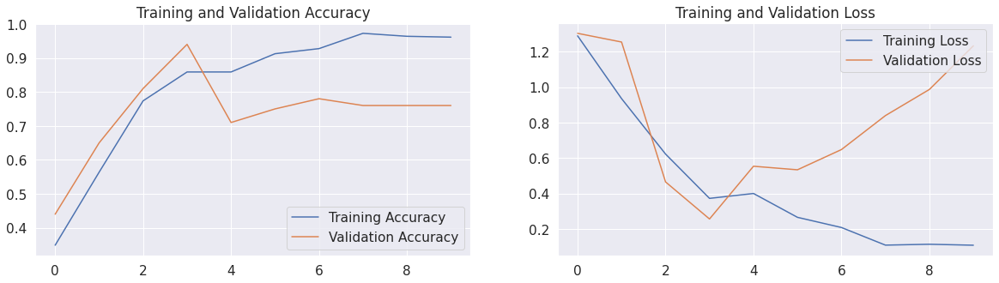

Accuracy:  96.13 %
Loss:  0.10943006724119186
Validation Accuracy:  76.0 %
Validation Loss:  1.232559084892273


In [66]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
 
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs_range = list(range(len((val_acc))))
 
plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
 
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()
 

print("Accuracy: ",round(history.history['accuracy'][-1]*100, 2),"%")
print("Loss: ",history.history['loss'][-1])
print("Validation Accuracy: ",round(history.history['val_accuracy'][-1]*100, 2),"%")
print("Validation Loss: ",history.history['val_loss'][-1])

In [67]:
# Predict classes

img_width = 150
img_height = 150
test_data_path = '/tmp/Markisa_v2/Markisa_v2/testing_data/'

test_generator = ImageDataGenerator(rescale=1/255)
test_data_generator = test_generator.flow_from_directory(
    test_data_path, # Put your path here
     target_size=(img_width, img_height),
    batch_size=32,
    shuffle=False)
test_steps_per_epoch = np.math.ceil(test_data_generator.samples / test_data_generator.batch_size)

predictions = model.predict(test_data_generator, steps=test_steps_per_epoch)
# Get most likely class
predicted_classes = np.argmax(predictions, axis=1)

Found 100 images belonging to 4 classes.


In [68]:
#Get ground-truth classes and class-labels

true_classes = test_data_generator.classes
class_labels = list(test_data_generator.class_indices.keys())   
class_labels_values = list(test_data_generator.class_indices.values())

                precision    recall  f1-score   support

 Markisa Besar       1.00      1.00      1.00        25
Markisa Kuning       0.76      1.00      0.86        25
 Markisa Manis       1.00      0.28      0.44        25
  Markisa Ungu       0.71      1.00      0.83        25

      accuracy                           0.82       100
     macro avg       0.87      0.82      0.78       100
  weighted avg       0.87      0.82      0.78       100



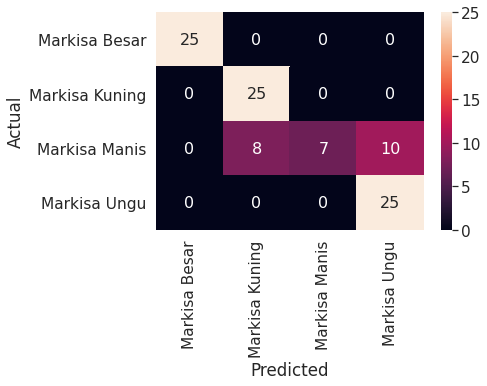

In [69]:
cm=confusion_matrix(true_classes, predicted_classes, labels=class_labels_values)
cm_df=pd.DataFrame(cm, index=class_labels, columns=class_labels)



report = metrics.classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)   

sn.set(font_scale=1.4) # for label size
sn.heatmap(cm_df, annot=True, annot_kws={"size": 16}) # font size
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: RuntimeWarning: invalid value encountered in true_divide


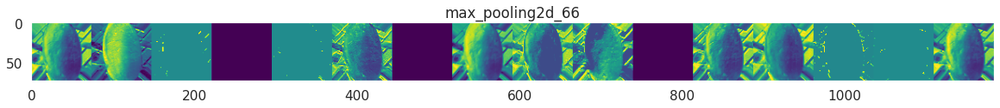

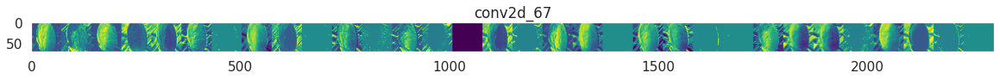

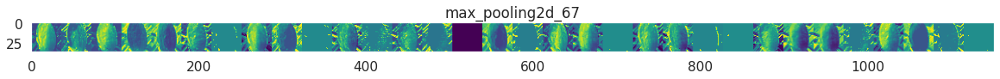

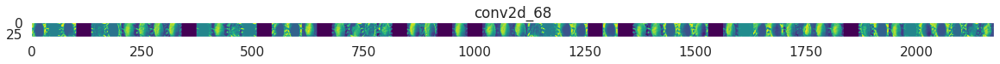

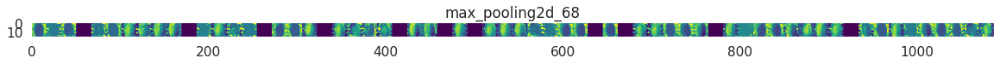

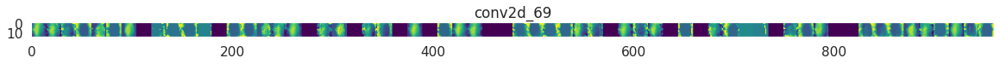

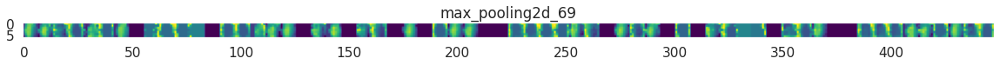

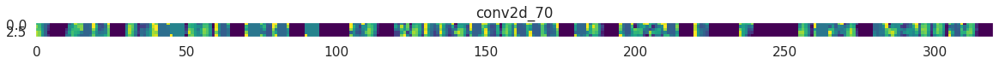

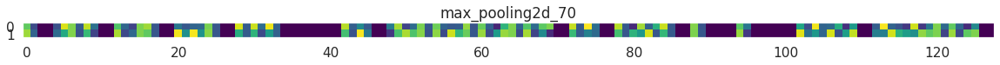

In [73]:
import numpy as np
import random
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# Let's define a new Model that will take an image as input, and will output
# intermediate representations for all layers in the previous model after
# the first.
successive_outputs = [layer.output for layer in model.layers[1:]]
#visualization_model = Model(img_input, successive_outputs)
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)
# Let's prepare a random input image from the training set.

besar_pix = [os.path.join(train_besar_dir, fname) 
                for fname in train_besar_names]
kuning_pix = [os.path.join(train_kuning_dir, fname) 
                for fname in train_kuning_names]
manis_pix = [os.path.join(train_manis_dir, fname) 
                for fname in train_manis_names]
ungu_pix = [os.path.join(train_ungu_dir, fname) 
                for fname in train_ungu_names]


img_path = random.choice(besar_pix + kuning_pix + manis_pix + ungu_pix)

img = load_img(img_path, target_size=(150, 150))  # this is a PIL image
x = img_to_array(img)  # Numpy array with shape (150, 150, 3)
x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 150, 150, 3)

# Rescale by 1/255
x /= 255

# Let's run our image through our network, thus obtaining all
# intermediate representations for this image.
successive_feature_maps = visualization_model.predict(x)

# These are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in model.layers[1:]]

# Now let's display our representations
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  if len(feature_map.shape) == 4:
    # Just do this for the conv / maxpool layers, not the fully-connected layers
    n_features = feature_map.shape[-1]  # number of features in feature map
    # The feature map has shape (1, size, size, n_features)
    size = feature_map.shape[1]
    # We will tile our images in this matrix
    display_grid = np.zeros((size, size * n_features))
    for i in range(n_features):
      # Postprocess the feature to make it visually palatable
      x = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std()
      x *= 64
      x += 128
      x = np.clip(x, 0, 255).astype('uint8')
      # We'll tile each filter into this big horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x
    # Display the grid
    scale = 20. / n_features
    plt.figure(figsize=(scale * n_features, scale))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

In [124]:
import numpy as np
from google.colab import files
from keras.preprocessing import image

key = 0

uploaded = files.upload()

for fn in uploaded.keys():
 
  # predicting images
  path = '/content/' + fn
  img = image.load_img(path, target_size=(150, 150))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = list(model.predict(images, batch_size=10))
  flatten_x = np.concatenate(classes)
  print(classes[0])

  dictionary_class = list(train_generator.class_indices.keys())

  for i in range(len(flatten_x)):
    if flatten_x[i] == 1:
      break
    elif flatten_x[i] == 0:
     key= key+1
     continue

  print(fn + " is " + dictionary_class[key])


Saving HGPHGJ8P85ZfT4BK0bhPz.jpg to HGPHGJ8P85ZfT4BK0bhPz.jpg
[0. 1. 0. 0.]
HGPHGJ8P85ZfT4BK0bhPz.jpg is Markisa Kuning
